In [1]:
# !unzip "drive/MyDrive/dog-breed-identification.zip" -d 'drive/MyDrive/Dog Breed/'

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
## Problem: Identifying the breed of a dog, given an image of a dog.

In [4]:
## Data: From KAggle

In [5]:
## Evaluation: Something with Probabilities

In [6]:
## Features: Unstructured Data

In [7]:
import tensorflow as tf
import tensorflow_hub as hub

In [8]:
print('GPU' if tf.config.list_physical_devices('GPU') else 'No')

GPU


In [9]:
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Dog Breed/labels.csv')
print(labels_csv.describe())
print(labels_csv)

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                     id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e2

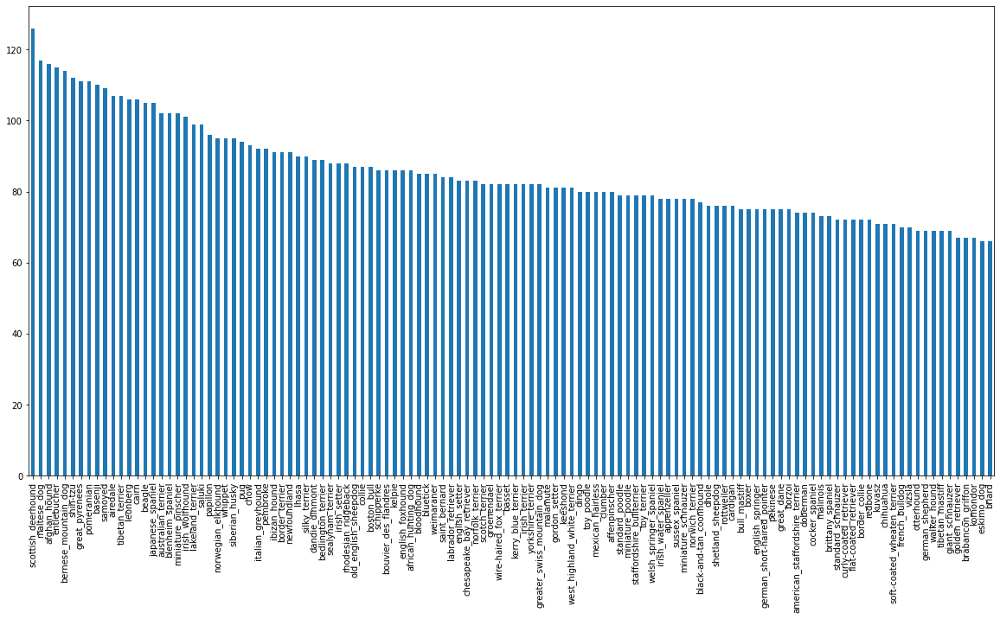

In [10]:
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [11]:
labels_csv['breed'].value_counts().median()

82.0

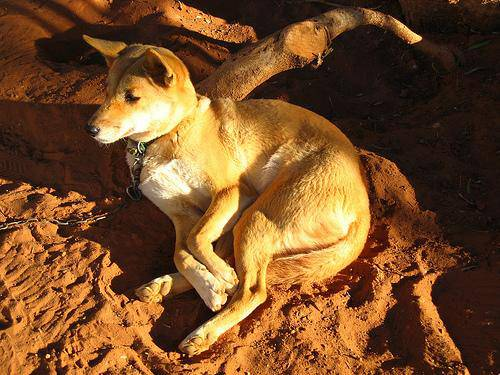

In [12]:
from IPython.display import Image
Image('/content/drive/MyDrive/Dog Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

In [13]:
filenames = ['/content/drive/MyDrive/Dog Breed/train/' + fname + '.jpg' for fname in labels_csv['id']]
filenames[:5]

['/content/drive/MyDrive/Dog Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Breed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Breed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [14]:
import os
if len(os.listdir('/content/drive/MyDrive/Dog Breed/train/'))==len(filenames):
  print('Proceed')
else:
  print('Check')

Proceed


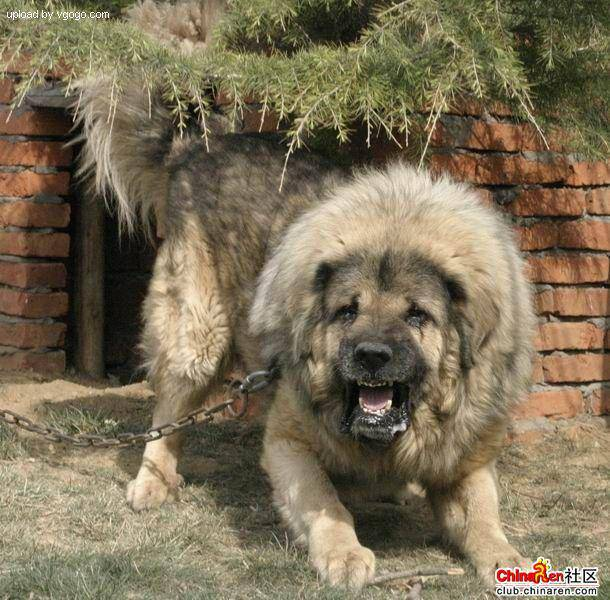

In [15]:
Image(filenames[9000])

In [16]:
labels_csv['breed'][9000]

'tibetan_mastiff'

In [17]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)

In [18]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [19]:
if len(labels)==len(filenames):
  print('Match')
else:
  print('Check directories')

Match


In [20]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [21]:
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [22]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [23]:
print(labels[0])
print(np.where(unique_breeds==labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
X = filenames
y= boolean_labels

In [25]:
NUM_IMAGES = 1000 #@param {type:"slider", min: 1000, max: 10000, step: 1000}

In [26]:
from scipy.sparse.construct import random
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=.2,
                                                  random_state = 42)
len(X_train), len(X_val), len(y_train),len(y_val)

(800, 200, 800, 200)

In [27]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [28]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [29]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [30]:
IMG_SIZE = 224

def process_image(image_path, img_size= IMG_SIZE):
  """
  Takes an image file path and turns the image into a tensor.
  """

  image = tf.io.read_file(image_path)

  image = tf.image.decode_jpeg(image,channels=3)

  image = tf.image.convert_image_dtype(image, tf.float32)

  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])

  return image

In [31]:
def get_image_label(image_path,label):
  image = process_image(image_path)
  return image, label

In [32]:
process_image(X[42],tf.constant(y[42]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [33]:
BATCH_SIZE = 32

def create_data_batches(X,y=None,batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  if test_data:
    print('Creating test data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  elif valid_data:
    print('Creating validation data batches')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    data_batch= data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data_batch= data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [34]:
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches
Creating validation data batches


In [35]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [36]:
## Visualizing Data
import matplotlib.pyplot as plt
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])

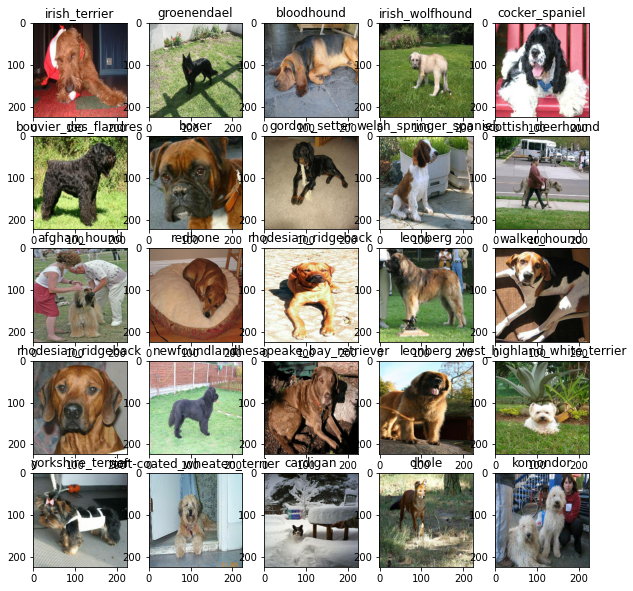

In [37]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

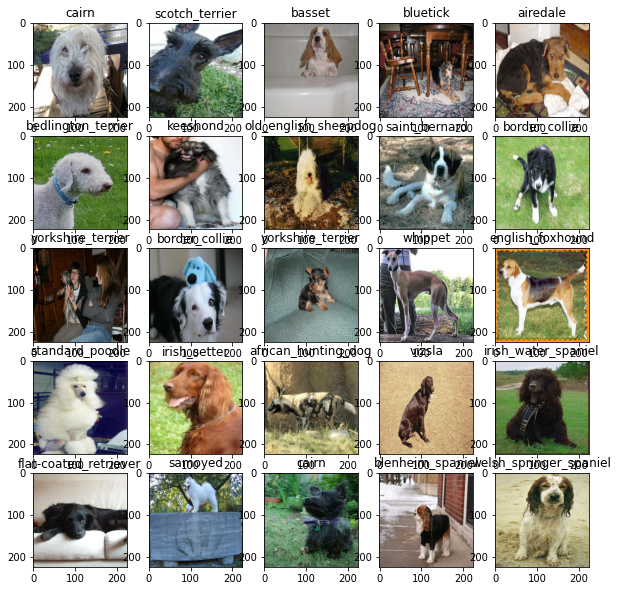

In [38]:
val_images, val_labels= next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

In [39]:
INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE,3]

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

In [40]:
def create_model(input_shape=INPUT_SHAPE, output_sahpe = OUTPUT_SHAPE,model_url = MODEL_URL):
  print('Building model with :', model_url)

  model = tf.keras.Sequential([
  hub.KerasLayer(model_url),
  tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                        activation= 'softmax')
  ])

  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer= tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  model.build(input_shape)

  return model

In [41]:
model = create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [42]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [43]:
%load_ext tensorboard

In [44]:
import datetime

def create_tensorflow_callback():
  logdir = os.path.join('/content/drive/MyDrive/Dog Breed/logs',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

In [45]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

In [46]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100,step:10}

In [47]:
def train_model():
  model=create_model()

  tensorboard = create_tensorflow_callback()

  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data= val_data,
            validation_freq=1,
            callbacks= [tensorboard, early_stopping])
  
  return model

In [48]:
model = train_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 138s 5s/step - loss: 4.4033 - accuracy: 0.1025 - val_loss: 3.4222 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 4s 143ms/step - loss: 1.5530 - accuracy: 0.6950 - val_loss: 2.2531 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 3s 117ms/step - loss: 0.5556 - accuracy: 0.9287 - val_loss: 1.7590 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 147ms/step - loss: 0.2472 - accuracy: 0.9862 - val_loss: 1.5846 - val_accuracy: 0.5800
Epoch 5/100
25/25 [==============================] - 3s 120ms/step - loss: 0.1454 - accuracy: 0.9987 - val_loss: 1.5007 - val_accuracy: 0.5900
Epoch 6/100
25/25 [==============================] - 3s 120ms/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 1.4546 - val_accuracy: 0.6150
Epoch 7/100
25/25 [==============================

In [49]:
%tensorboard --logdir drive/My\ Drive/Dog\ Breed/logs

<IPython.core.display.Javascript object>

In [50]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 4s 96ms/step


array([[1.2415923e-03, 6.0565941e-05, 1.9627670e-03, ..., 4.5100634e-04,
        1.2009351e-04, 1.8260088e-03],
       [8.2187569e-03, 9.8088209e-04, 4.1170374e-02, ..., 3.3622715e-03,
        3.2883286e-03, 6.9942715e-04],
       [6.0489652e-05, 1.2288942e-03, 6.0501996e-05, ..., 8.1155340e-05,
        1.1427741e-03, 7.7071483e-04],
       ...,
       [1.1563307e-05, 1.2679315e-04, 1.3688352e-04, ..., 4.0000805e-06,
        1.5703731e-04, 1.3323280e-05],
       [1.4254070e-03, 2.4864578e-04, 1.1898347e-03, ..., 5.9651374e-04,
        1.9812353e-04, 7.7171279e-03],
       [2.7471941e-04, 3.5437257e-05, 9.8248175e-04, ..., 3.6812427e-03,
        1.2075205e-03, 4.7823218e-05]], dtype=float32)

In [51]:
predictions.shape

(200, 120)

In [52]:
np.sum(predictions[0])

0.99999994

In [53]:
index = 0
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[1.24159234e-03 6.05659407e-05 1.96276698e-03 1.31902940e-04
 7.44982390e-05 1.60592637e-04 2.24726610e-02 5.09288569e-04
 5.73389698e-04 7.12599023e-04 1.96156863e-04 2.73441168e-04
 3.13053082e-04 1.08110391e-04 1.08986523e-03 1.00964709e-04
 2.46817690e-05 1.44622535e-01 5.17421904e-05 8.82397289e-05
 1.42893652e-04 2.13192237e-04 9.25951317e-05 5.65384456e-04
 6.70793961e-05 5.62364730e-05 2.54666895e-01 7.95599117e-05
 3.93497940e-05 1.35425304e-04 1.52525390e-04 1.69246853e-03
 8.20452988e-04 7.41895419e-05 2.33805025e-04 1.37104876e-02
 1.78678656e-05 4.49976535e-04 2.98157800e-04 3.41395091e-04
 7.55982415e-04 2.62499398e-05 1.92911219e-04 3.02241009e-04
 6.47466732e-05 1.98145324e-04 1.86959023e-05 3.67958494e-03
 2.05855205e-04 2.82127206e-04 2.34758176e-04 3.02346198e-05
 2.18979301e-04 1.40789358e-04 8.65979964e-05 7.15346105e-05
 1.69533741e-04 2.43503111e-03 7.37349736e-04 1.39963701e-01
 2.04619835e-04 3.70931593e-05 3.11163341e-04 1.94278284e-04
 1.72480533e-04 3.213918

In [54]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

In [55]:
pred_label=get_pred_label(predictions[9])
pred_label

'collie'

In [56]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [57]:
def unbatchify(data):
  images=[]
  labels=[]
  for image,label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [58]:
get_pred_label(val_labels[0])

'affenpinscher'

In [59]:
images_ = []
labels_ = []

for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [60]:
get_pred_label(labels_[0])

'cairn'

In [61]:
def plot_pred(prediction_probabilities, labels,images,n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color='green'
  else:
    color='red'

  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)


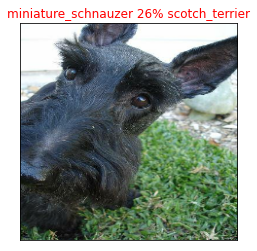

In [62]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [63]:
def plot_pred_conf(prediction_probabilities, labels,n=1):
  pred_prob, true_label = prediction_probabilities[n],labels[n]

  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels,
             rotation='vertical')
  
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

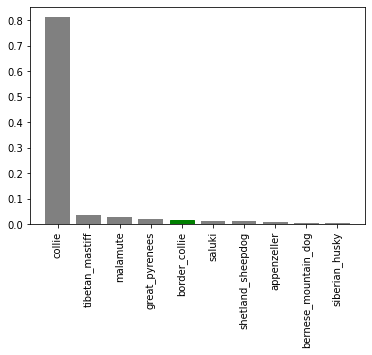

In [64]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

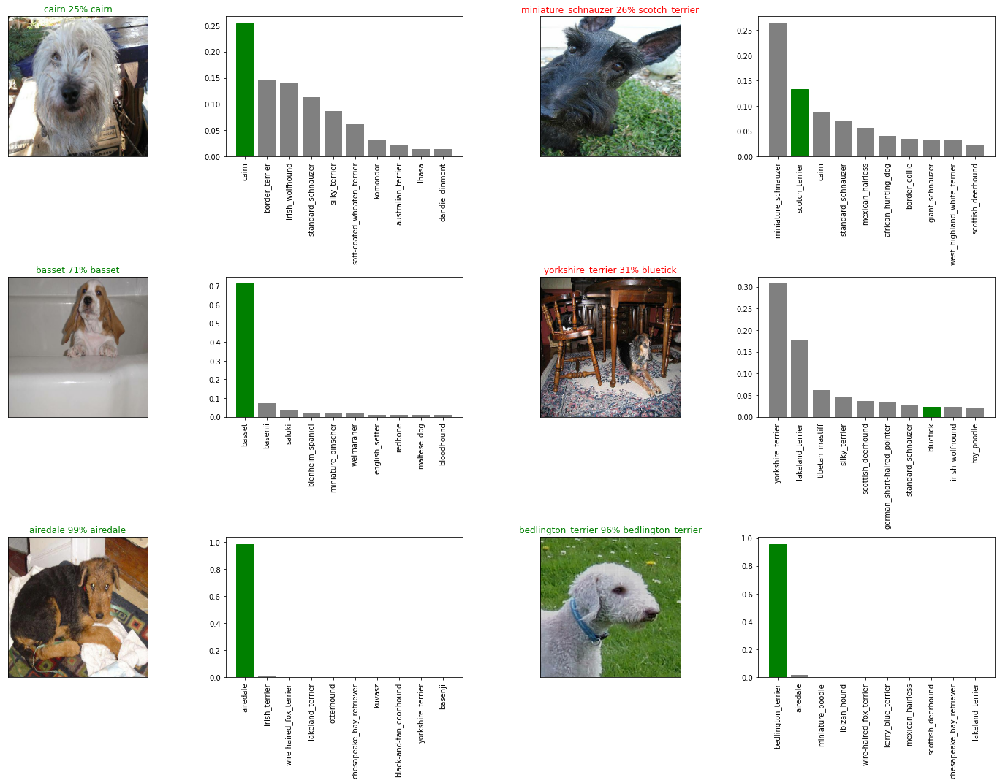

In [65]:
# Let's check out a few predictions and their different values

i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities= predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


Create confusion matrix with model's predictions and true labels

Saving and reloading a trained model

In [66]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/Dog Breed/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [67]:
# Create a function to load a trained model
def load_model(model_path):
  print(f'Loading saved model from: {model_path}')
  model= tf.keras.models.load_model(model_path,
                                    custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [68]:
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog Breed/models/20230117-09271673947653-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Breed/models/20230117-09271673947653-1000-images-mobilenetv2-Adam.h5'

In [69]:
loaded_1000_image_model= load_model('/content/drive/MyDrive/Dog Breed/models/20230116-18151673892917-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Breed/models/20230116-18151673892917-1000-images-mobilenetv2-Adam.h5


Evaluate the pre-saved model

In [70]:
model.evaluate(val_data)

7/7 [==============================] - 1s 97ms/step - loss: 1.3828 - accuracy: 0.6150


[1.3827698230743408, 0.6150000095367432]

In [71]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 85ms/step - loss: 1.2372 - accuracy: 0.6750


[1.2371999025344849, 0.675000011920929]

Training a big dog model on the full data.

In [72]:
len(X),len(y)

(10222, 10222)

In [73]:
full_data = create_data_batches(X,y)

Creating training data batches


In [74]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [75]:
# Create a model for full model
full_model = create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [76]:
# Create full model callbacks
full_model_tensorboard = create_tensorflow_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience = 3)

**Note** : Below cell will take about 30 minutes.

In [77]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs= NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 34s 96ms/step - loss: 1.3501 - accuracy: 0.6641
Epoch 2/100
320/320 [==============================] - 30s 94ms/step - loss: 0.4013 - accuracy: 0.8830
Epoch 3/100
320/320 [==============================] - 30s 94ms/step - loss: 0.2379 - accuracy: 0.9354
Epoch 4/100
320/320 [==============================] - 30s 93ms/step - loss: 0.1545 - accuracy: 0.9630
Epoch 5/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1069 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0777 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0577 - accuracy: 0.9922
Epoch 8/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0475 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0370 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 29s 92ms/step - 

In [78]:
save_model(full_model,suffix='full-image-set-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog Breed/models/20230117-09421673948575-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Breed/models/20230117-09421673948575-full-image-set-mobilenetv2-Adam.h5'

In [83]:
loaded_full_model = load_model('/content/drive/MyDrive/Dog Breed/models/20230117-09421673948575-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Breed/models/20230117-09421673948575-full-image-set-mobilenetv2-Adam.h5


Making predictions on the test dataset

In [84]:
# Load test image filenames
test_path = '/content/drive/MyDrive/Dog Breed/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [85]:
# Create test databatch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


**Note** Calling predict on our full model will take about 1 hour

In [86]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1630s 5s/step


Save predictions (Numpy array) to csv file (for access later)

In [88]:
np.savetxt('/content/drive/MyDrive/Dog Breed/preds_array.csv',test_predictions, delimiter=',')

In [89]:
# Load predictions (Numpy array) from csv file
test_predictions=np.loadtxt('/content/drive/MyDrive/Dog Breed/preds_array.csv', delimiter=',')

In [90]:
test_predictions[:10]

array([[4.42089854e-12, 6.07121571e-14, 3.69225484e-13, ...,
        4.64602619e-12, 3.85883444e-14, 1.18517904e-10],
       [4.25491287e-09, 5.08637521e-10, 1.47786887e-11, ...,
        1.72680728e-07, 2.94726397e-05, 1.12177529e-08],
       [2.64500285e-14, 1.69644279e-12, 7.78824296e-17, ...,
        8.74835110e-15, 1.01937954e-18, 2.03356878e-17],
       ...,
       [1.81067269e-14, 3.19728163e-12, 1.12078925e-13, ...,
        5.21327564e-11, 1.29522293e-09, 5.10830419e-13],
       [1.81461776e-10, 1.03869377e-06, 3.59314523e-10, ...,
        5.46538370e-11, 5.20325045e-08, 1.06229225e-09],
       [1.09139950e-08, 1.27324574e-11, 3.62471358e-10, ...,
        2.48579456e-12, 2.41589951e-12, 5.76185641e-07]])

In [92]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle
'https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation'

In [94]:
preds_df = pd.DataFrame(columns=['id']+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [96]:
# Append test image ids to predictions DataFrame.
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id']= test_ids

In [97]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6cbd88414627be43910a1977ce28595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e774fbfeb4b712ca042f93edea3835af,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e75eb1ed7b8e53fec8eb9e03c57153b2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e783e22d4f370b6cc0b1f44b4d6584a8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e6ec1891d8f52a13683c73cabd3045cb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,07078b939febab04a2b84cefb6f50dd8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,076d962aa496391d14bcf7dd8878a24c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,07ae657216e11b5b5d78d89faca53314,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,0763ebab76bfd9cbfaac696cc604d35e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [98]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6cbd88414627be43910a1977ce28595,4.420899e-12,6.071216e-14,3.692255e-13,3.790420e-09,6.742246e-09,2.018513e-13,3.654628e-14,4.868745e-15,1.702795e-18,...,1.710099e-13,1.004924e-13,1.338834e-12,2.182093e-12,2.226973e-13,5.072207e-14,4.968673e-16,4.646026e-12,3.858834e-14,1.185179e-10
1,e774fbfeb4b712ca042f93edea3835af,4.254913e-09,5.086375e-10,1.477869e-11,3.094937e-05,1.221912e-09,3.038787e-08,4.572727e-08,8.792995e-10,7.851860e-10,...,4.776260e-09,5.244545e-09,3.456209e-07,3.556122e-10,1.305419e-11,1.409821e-08,1.091318e-10,1.726807e-07,2.947264e-05,1.121775e-08
2,e75eb1ed7b8e53fec8eb9e03c57153b2,2.645003e-14,1.696443e-12,7.788243e-17,2.494902e-15,2.586585e-11,1.984941e-15,3.368547e-15,1.896577e-12,4.332860e-13,...,2.333975e-14,2.930891e-14,2.989891e-13,2.996031e-11,4.585840e-13,1.656899e-15,5.477486e-14,8.748351e-15,1.019380e-18,2.033569e-17
3,e783e22d4f370b6cc0b1f44b4d6584a8,1.773801e-09,7.291256e-13,2.588288e-10,2.827915e-10,1.694770e-08,3.445723e-09,1.006463e-11,1.623644e-09,2.304968e-12,...,8.407465e-10,1.366221e-09,1.279460e-08,6.720269e-11,3.192526e-10,1.995240e-12,5.184869e-10,3.842653e-06,5.599711e-11,1.445457e-10
4,e6ec1891d8f52a13683c73cabd3045cb,3.109464e-07,8.914797e-12,2.276695e-11,9.129015e-05,1.549669e-10,9.285075e-11,5.840735e-13,6.569337e-12,2.570302e-13,...,1.324550e-09,7.562774e-12,2.320902e-12,7.610947e-12,2.980662e-11,1.515698e-10,1.391498e-11,1.223855e-09,2.958278e-06,2.532332e-09


In [99]:
preds_df.to_csv('/content/drive/MyDrive/Dog Breed/full_model_predictions_submission_1_mobilenetV2.csv',
                index=False)

## Making predictions on custom images


In [102]:
custom_path = '/content/drive/MyDrive/Dog Breed/my-dog-photos/'
custom_image_paths = [custom_path+ fname for fname in os.listdir(custom_path)]

In [103]:
custom_image_paths

['/content/drive/MyDrive/Dog Breed/my-dog-photos/IMG_20190831_112909.jpg']

In [105]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [106]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 887ms/step


In [107]:
custom_preds.shape

(1, 120)

In [109]:
# get custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['cocker_spaniel']

In [110]:
# Get custom images (unbatchify) won't work because of no labels
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

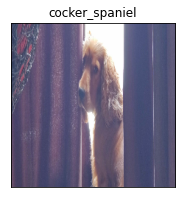

In [112]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)